<a href="https://colab.research.google.com/github/larauj/python_sql/blob/main/an_lise_de_dados_do_ibge_manaus_am.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Análise de dados do IBGE para a cidade de Manaus-AM

## Resumo

Neste notebook, iremos explorar dados do Censo de 2010 do IBGE utilizando a linguagem Python e as bibliotecas Folium e GeoPandas.

In [ ]:
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import contextily
import folium
import matplotlib.pyplot as plt
import seaborn as sns

import os
from urllib.request import urlretrieve
import zipfile

In [ ]:
sns.set(font_scale=1.4)
sns.set_style({'font.family': 'serif',
               'fontname': 'Times New Roman'})

## 1) Fontes de dados

### 1.1) Setores censitários

* Fonte: [Instituto Brasileiro de Geografia e Estatística (IBGE)](https://www.ibge.gov.br/geociencias/organizacao-do-territorio/malhas-territoriais/26565-malhas-de-setores-censitarios-divisoes-intramunicipais.html?=&t=downloads)

In [ ]:
if not os.path.exists('/kaggle/working/mapas'):
    os.makedirs('/kaggle/working/mapas')

In [ ]:
url_setores_censitarios = 'https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_de_setores_censitarios__divisoes_intramunicipais/censo_2010/setores_censitarios_shp/am/am_setores_censitarios.zip'

In [ ]:
%%time

urlretrieve(url_setores_censitarios, '/kaggle/working/mapas/am_setores_censitarios.zip')

CPU times: user 43.5 ms, sys: 57.4 ms, total: 101 ms
Wall time: 8.86 s


('/kaggle/working/mapas/am_setores_censitarios.zip',
 <http.client.HTTPMessage at 0x7efde2e99990>)

In [ ]:
with zipfile.ZipFile('/kaggle/working/mapas/am_setores_censitarios.zip', 'r') as zip_ref:
    zip_ref.extractall('/kaggle/working/mapas/')

In [ ]:
os.remove('/kaggle/working/mapas/am_setores_censitarios.zip')

In [ ]:
am_setores_gdf = gpd.read_file('/kaggle/working/mapas/13SEE250GC_SIR.shp')

In [ ]:
am_setores_gdf.shape

(6184, 14)

In [ ]:
am_setores_gdf.head()

,ID,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,geometry
0,3215,130260305060048,URBANO,130260305001,Centro,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-60.01540 -3.13318, -60.01523 -3.132..."
1,3216,130260305060049,URBANO,130260305001,Centro,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-60.01451 -3.13691, -60.01469 -3.136..."
2,3217,130260305060050,URBANO,130260305001,Centro,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-60.01043 -3.13480, -60.01043 -3.134..."
3,3218,130260305060051,URBANO,130260305002,Nossa Senhora Aparecida,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-60.02882 -3.12463, -60.02882 -3.124..."
4,3219,130260305060052,URBANO,130260305002,Nossa Senhora Aparecida,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-60.02882 -3.12463, -60.02879 -3.123..."


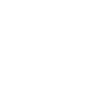

In [ ]:
am_setores_gdf.iloc[0].geometry

In [ ]:
am_setores_gdf.crs.to_string()

'EPSG:4674'

In [ ]:
am_setores_gdf = am_setores_gdf.to_crs(crs='EPSG:3857')

In [ ]:
am_setores_gdf.crs.to_string()

'EPSG:3857'

In [ ]:
am_setores_gdf.head()

,ID,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,geometry
0,3215,130260305060048,URBANO,130260305001,Centro,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-6680884.102 -348958.522, -6680865.1..."
1,3216,130260305060049,URBANO,130260305001,Centro,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-6680785.198 -349373.286, -6680805.2..."
2,3217,130260305060050,URBANO,130260305001,Centro,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-6680330.912 -349138.824, -6680330.7..."
3,3218,130260305060051,URBANO,130260305002,Nossa Senhora Aparecida,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-6682377.898 -348005.096, -6682377.5..."
4,3219,130260305060052,URBANO,130260305002,Nossa Senhora Aparecida,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-6682377.898 -348005.096, -6682374.1..."


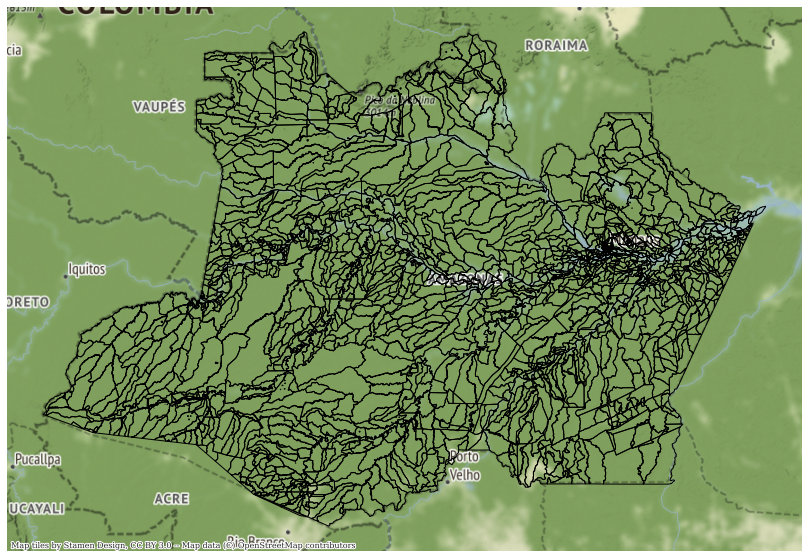

In [ ]:
ax = am_setores_gdf.plot(figsize=(15, 10), edgecolor='black', facecolor='none')
contextily.add_basemap(ax)
ax.set_axis_off()
plt.show()

In [ ]:
mao_setores_gdf = am_setores_gdf[am_setores_gdf['NM_MUNICIP'] == 'MANAUS']

In [ ]:
mao_setores_gdf.shape

(2461, 14)

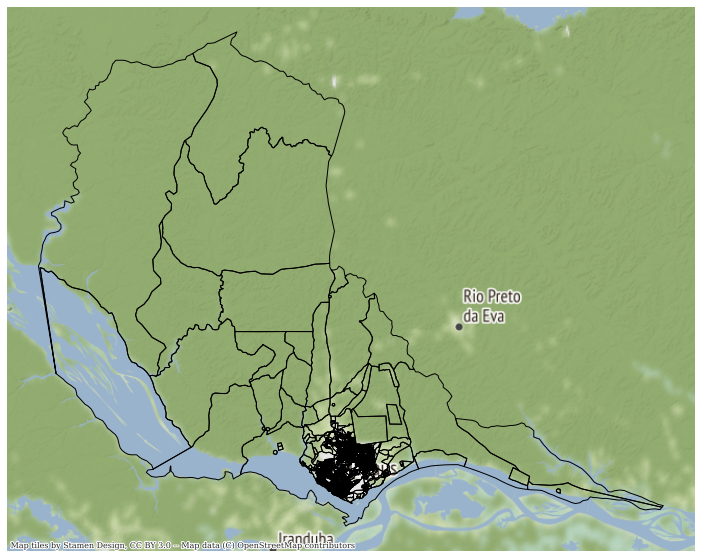

In [ ]:
ax = mao_setores_gdf.plot(figsize=(15, 10), edgecolor='black', facecolor='none')
contextily.add_basemap(ax)
ax.set_axis_off()
plt.show()

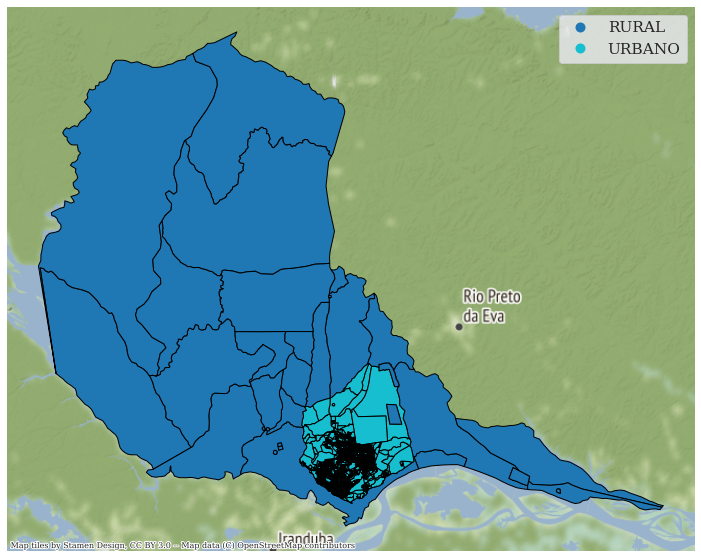

In [ ]:
ax = mao_setores_gdf.plot(figsize=(15, 10), edgecolor='black', column='TIPO', legend=True)
contextily.add_basemap(ax)
ax.set_axis_off()
plt.show()

In [ ]:
mao_setores_urb_gdf = mao_setores_gdf[mao_setores_gdf['TIPO'] == 'URBANO']

In [ ]:
mao_setores_urb_gdf.shape

(2429, 14)

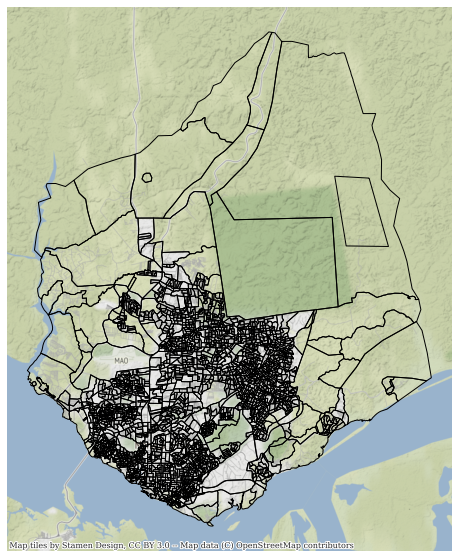

In [ ]:
ax = mao_setores_urb_gdf.plot(figsize=(15, 10), edgecolor='black', facecolor='none')
contextily.add_basemap(ax)
ax.set_axis_off()
plt.show()

In [ ]:
mao_setores_urb_gdf.head()

,ID,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,geometry
0,3215,130260305060048,URBANO,130260305001,Centro,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-6680884.102 -348958.522, -6680865.1..."
1,3216,130260305060049,URBANO,130260305001,Centro,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-6680785.198 -349373.286, -6680805.2..."
2,3217,130260305060050,URBANO,130260305001,Centro,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-6680330.912 -349138.824, -6680330.7..."
3,3218,130260305060051,URBANO,130260305002,Nossa Senhora Aparecida,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-6682377.898 -348005.096, -6682377.5..."
4,3219,130260305060052,URBANO,130260305002,Nossa Senhora Aparecida,13026030506,PRIMEIRA R.A.,130260305,MANAUS,1302603,MANAUS,MANAUS,CENTRO AMAZONENSE,"POLYGON ((-6682377.898 -348005.096, -6682374.1..."


In [ ]:
mao_setores_urb_gdf['NM_BAIRRO'].unique()

array(['Centro', 'Nossa Senhora Aparecida', 'Presidente Vargas',
       'Compensa', 'Petrópolis', 'Japiim', 'Parque 10 de Novembro',
       'Flores', 'Aleixo', 'Cidade de Deus', 'Cidade Nova', 'Nova Cidade',
       'Alvorada', 'Nova Esperança', 'Lírio do Vale',
       'Morro da Liberdade', 'Colônia Oliveira Machado', 'Educandos',
       'Santa Luzia', None, 'Lago Azul', 'Praça 14 de Janeiro',
       'Cachoeirinha', 'Vila da Prata', 'São Jorge', 'Santo Antônio',
       'Santo Agostinho', 'São Raimundo', 'Glória', 'Planalto',
       'Ponta Negra', 'Redenção', 'Da Paz', 'Dom Pedro I', 'Tarumã',
       'Raiz', 'São Francisco', 'Coroado', 'Crespo', 'São Lázaro',
       'Betânia', 'Distrito Industrial I', 'Vila Buriti',
       'Distrito Industrial II', 'Armando Mendes', 'Gilberto Mestrinho',
       'Colônia Antônio Aleixo', 'Puraquequara', 'Mauazinho',
       'Jorge Teixeira', 'Adrianópolis', 'Nossa Senhora das Graças',
       'Chapada', 'São Geraldo', 'Novo Aleixo', 'Tancredo Neves',
      

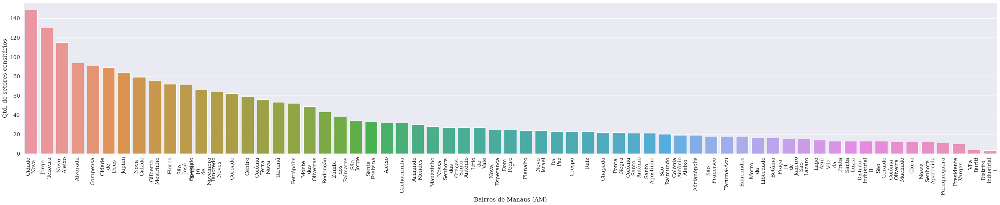

In [ ]:
plt.figure(figsize=(50,8))

ax = sns.countplot(x='NM_BAIRRO', 
                   data=mao_setores_urb_gdf, 
                   order=mao_setores_urb_gdf['NM_BAIRRO'].value_counts().index)

labels = [item.get_text().replace(' ', '\n') for item in ax.get_xticklabels()]
ax.set_xticklabels(labels, rotation = 90)

ax.set_xlabel('Bairros de Manaus (AM)')
ax.set_ylabel('Qtd. de setores censitários')

plt.show()

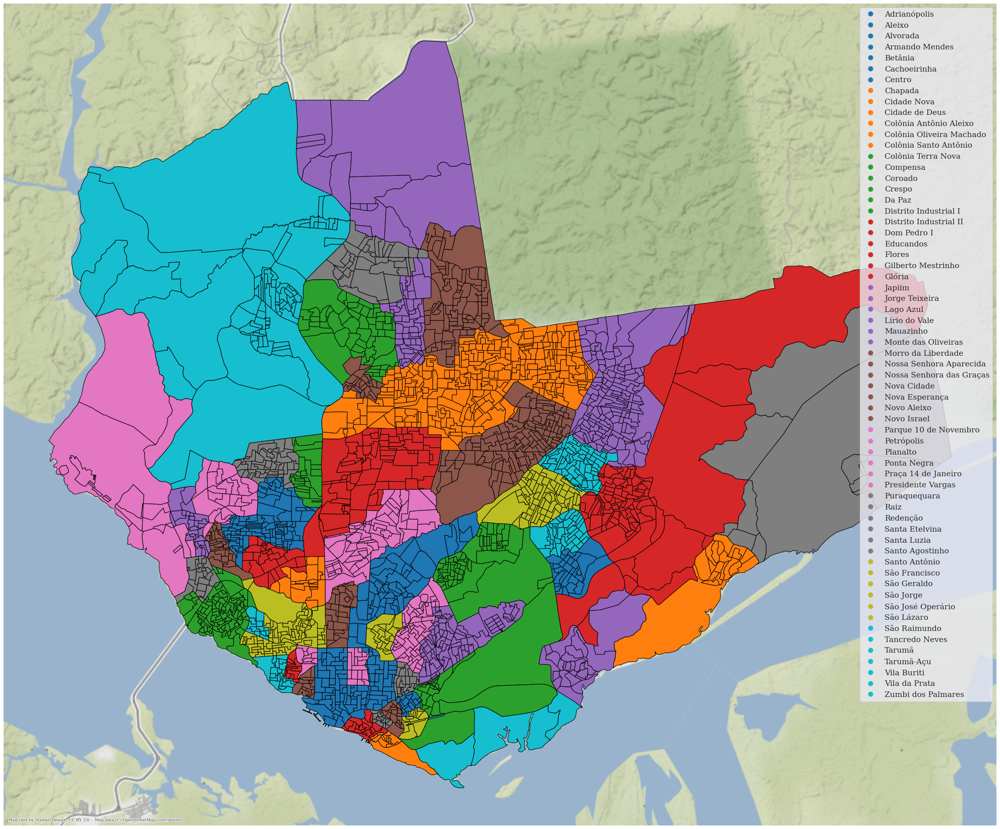

In [ ]:
ax = mao_setores_urb_gdf.plot(figsize=(50, 30), edgecolor='black', column='NM_BAIRRO', legend=True)
contextily.add_basemap(ax)
ax.set_axis_off()
plt.show()

In [ ]:
mao_setores_urb_gdf.to_file('/kaggle/working/mapas/mao_setores_urb.json', driver='GeoJSON')

### 1.2) Censo de 2010

* Fonte: [Instituto Brasileiro de Geografia e Estatística (IBGE)](https://www.ibge.gov.br/geociencias/downloads-geociencias.html)

In [ ]:
if not os.path.exists('/kaggle/working/censo2010'):
    os.makedirs('/kaggle/working/censo2010')

In [ ]:
url_censo_2010_am = 'https://ftp.ibge.gov.br/Censos/Censo_Demografico_2010/Resultados_do_Universo/Agregados_por_Setores_Censitarios/AM_20171016.zip'

In [ ]:
%%time

urlretrieve(url_censo_2010_am, '/kaggle/working/censo2010/AM_20171016.zip')

CPU times: user 191 ms, sys: 189 ms, total: 380 ms
Wall time: 35.2 s


('/kaggle/working/censo2010/AM_20171016.zip',
 <http.client.HTTPMessage at 0x7efde29e81d0>)

In [ ]:
with zipfile.ZipFile('/kaggle/working/censo2010/AM_20171016.zip', 'r') as zip_ref:
    zip_ref.extractall('/kaggle/working/censo2010/')

In [ ]:
os.remove('/kaggle/working/censo2010/AM_20171016.zip')

![Arquivos da Base de Informações por Setores Censitários.png](attachment:ba5691fd-ed95-4aea-8188-570a11fbd7a3.png)

In [ ]:
am_censo_entorno01_df = pd.read_csv('/kaggle/working/censo2010/AM/Base informaçoes setores2010 universo AM/CSV/Entorno01_AM.csv', sep=';')

In [ ]:
am_censo_entorno01_df.shape

(5641, 205)

In [ ]:
am_censo_entorno01_df.head()

,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,V007,V008,...,V194,V195,V196,V197,V198,V199,V200,V201,Unnamed: 203,Unnamed: 204
0,130002905000001,1,146,120,4,6,0,6,0,120,...,2,5,42,68,1,6,4.0,106.0,NaN,NaN
1,130002905000002,1,196,168,0,14,0,14,0,118,...,59,4,110,9,0,63,0.0,119.0,NaN,NaN
2,130002905000003,1,146,143,0,1,0,2,0,137,...,0,5,0,136,0,5,0.0,136.0,NaN,NaN
3,130002905000004,8,23,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.0,0.0,NaN,NaN
4,130002905000006,8,103,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0.0,0.0,NaN,NaN


## 2) O que podemos extrair de informações dos dados?

### 2.1) Limpeza e transformação de dados

In [ ]:
am_censo_entorno01_df.dtypes

Cod_setor           int64
Situacao_setor      int64
V001               object
V002               object
V003               object
                   ...   
V199               object
V200              float64
V201              float64
Unnamed: 203      float64
Unnamed: 204      float64
Length: 205, dtype: object

In [ ]:
colunas = [
    'V001', # Domicílios
    'V008', 'V010', 'V012', # Iluminação pública
    'V014', 'V016', 'V018', # Pavimentação
    'V020', 'V022', 'V024', # Calçada
    'V038', 'V040', 'V042', # Rampa para cadeirante
    'V044', 'V046', 'V048' # Arborização
          ]  
am_censo_entorno01_df[colunas] = am_censo_entorno01_df[colunas].replace('X', '0')

In [ ]:
am_censo_entorno01_df[colunas] = am_censo_entorno01_df[colunas].astype(int, copy=False)

In [ ]:
am_censo_entorno01_df.dtypes

Cod_setor           int64
Situacao_setor      int64
V001                int64
V002               object
V003               object
                   ...   
V199               object
V200              float64
V201              float64
Unnamed: 203      float64
Unnamed: 204      float64
Length: 205, dtype: object

In [ ]:
am_gdf = am_censo_entorno01_df[['Cod_setor'] + colunas]
am_gdf.head()

,Cod_setor,V001,V008,V010,V012,V014,V016,V018,V020,V022,V024,V038,V040,V042,V044,V046,V048
0,130002905000001,146,120,6,6,120,6,6,43,0,6,0,0,0,40,3,3
1,130002905000002,196,118,11,9,168,14,14,41,4,0,0,0,0,0,0,0
2,130002905000003,146,137,1,2,142,1,2,22,1,1,0,0,0,82,0,2
3,130002905000004,23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,130002905000006,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
%%capture

am_gdf['ILUMINACAO'] = am_gdf.loc[:, 'V008':'V012'].sum(axis=1)
am_gdf['PAVIMENTACAO'] = am_gdf.loc[:, 'V014':'V018'].sum(axis=1)
am_gdf['CALCADA'] = am_gdf.loc[:, 'V020':'V024'].sum(axis=1)
am_gdf['RAMPA_CADEIRANTE'] = am_gdf.loc[:, 'V038':'V042'].sum(axis=1)
am_gdf['ARBORIZACAO'] = am_gdf.loc[:, 'V044':'V048'].sum(axis=1)

In [ ]:
am_gdf.head()

,Cod_setor,V001,V008,V010,V012,V014,V016,V018,V020,V022,...,V040,V042,V044,V046,V048,ILUMINACAO,PAVIMENTACAO,CALCADA,RAMPA_CADEIRANTE,ARBORIZACAO
0,130002905000001,146,120,6,6,120,6,6,43,0,...,0,0,40,3,3,132,132,49,0,46
1,130002905000002,196,118,11,9,168,14,14,41,4,...,0,0,0,0,0,138,196,45,0,0
2,130002905000003,146,137,1,2,142,1,2,22,1,...,0,0,82,0,2,140,145,24,0,84
3,130002905000004,23,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,130002905000006,103,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
am_gdf = am_gdf.drop(columns=colunas[1:]).copy()
am_gdf.head()

,Cod_setor,V001,ILUMINACAO,PAVIMENTACAO,CALCADA,RAMPA_CADEIRANTE,ARBORIZACAO
0,130002905000001,146,132,132,49,0,46
1,130002905000002,196,138,196,45,0,0
2,130002905000003,146,140,145,24,0,84
3,130002905000004,23,0,0,0,0,0
4,130002905000006,103,0,0,0,0,0


In [ ]:
am_gdf.columns = ['CD_GEOCODI', 'DOMICILIOS', 'ILUMINACAO', 'PAVIMENTACAO', 'CALCADA', 'RAMPA_CADEIRANTE', 'ARBORIZACAO']
am_gdf.head()

,CD_GEOCODI,DOMICILIOS,ILUMINACAO,PAVIMENTACAO,CALCADA,RAMPA_CADEIRANTE,ARBORIZACAO
0,130002905000001,146,132,132,49,0,46
1,130002905000002,196,138,196,45,0,0
2,130002905000003,146,140,145,24,0,84
3,130002905000004,23,0,0,0,0,0
4,130002905000006,103,0,0,0,0,0


In [ ]:
%%capture

mao_setores_urb_gdf['CD_GEOCODI'] = mao_setores_urb_gdf['CD_GEOCODI'].astype(int, copy=False)

In [ ]:
am_gdf = pd.merge(mao_setores_urb_gdf[['CD_GEOCODI', 'NM_BAIRRO', 'geometry']], am_gdf, on='CD_GEOCODI')
am_gdf = am_gdf.dropna().copy()
am_gdf.head()

,CD_GEOCODI,NM_BAIRRO,geometry,DOMICILIOS,ILUMINACAO,PAVIMENTACAO,CALCADA,RAMPA_CADEIRANTE,ARBORIZACAO
0,130260305060048,Centro,"POLYGON ((-6680884.102 -348958.522, -6680865.1...",213,213,213,213,23,25
1,130260305060049,Centro,"POLYGON ((-6680785.198 -349373.286, -6680805.2...",164,159,159,156,4,44
2,130260305060050,Centro,"POLYGON ((-6680330.912 -349138.824, -6680330.7...",0,0,0,0,0,0
3,130260305060051,Nossa Senhora Aparecida,"POLYGON ((-6682377.898 -348005.096, -6682377.5...",166,166,166,132,0,47
4,130260305060052,Nossa Senhora Aparecida,"POLYGON ((-6682377.898 -348005.096, -6682374.1...",208,208,208,156,0,185


In [ ]:
am_gdf.shape

(2396, 9)

In [ ]:
am_gdf.crs.to_string()

'EPSG:3857'

In [ ]:
am_gdf = am_gdf.to_crs(crs='EPSG:4326')

In [ ]:
am_gdf.crs.to_string()

'EPSG:4326'

In [ ]:
am_gdf.head()

,CD_GEOCODI,NM_BAIRRO,geometry,DOMICILIOS,ILUMINACAO,PAVIMENTACAO,CALCADA,RAMPA_CADEIRANTE,ARBORIZACAO
0,130260305060048,Centro,"POLYGON ((-60.01540 -3.13318, -60.01523 -3.132...",213,213,213,213,23,25
1,130260305060049,Centro,"POLYGON ((-60.01451 -3.13691, -60.01469 -3.136...",164,159,159,156,4,44
2,130260305060050,Centro,"POLYGON ((-60.01043 -3.13480, -60.01043 -3.134...",0,0,0,0,0,0
3,130260305060051,Nossa Senhora Aparecida,"POLYGON ((-60.02882 -3.12463, -60.02882 -3.124...",166,166,166,132,0,47
4,130260305060052,Nossa Senhora Aparecida,"POLYGON ((-60.02882 -3.12463, -60.02879 -3.123...",208,208,208,156,0,185


### 2.2) Visualizando informações de bairros

In [ ]:
coord_centro_manaus = [-3.1019400, -60.0250000]
mapa_manaus = folium.Map(location=coord_centro_manaus, zoom_start=12)

In [ ]:
mapa_manaus

In [ ]:
resolution, width, height = 100, 5, 5

for row in am_gdf.values:
    setor_geo = folium.GeoJson(row[2])
    
    setor_geo_id = row[0]
    setor_geo_bairro = row[1]
    
    html = '<h2>{}</h2>'.format('Setor Censitário: ' + str(setor_geo_id))
    html += '<hr>'
    html += '<p>{}</p>'.format('Bairro: ' + setor_geo_bairro)
    html += '<hr>'
    html += am_gdf[am_gdf['CD_GEOCODI'] == setor_geo_id][['DOMICILIOS', 
                                                          'ILUMINACAO', 
                                                          'PAVIMENTACAO']].to_html(index=False)
    html += am_gdf[am_gdf['CD_GEOCODI'] == setor_geo_id][['CALCADA',
                                                          'RAMPA_CADEIRANTE',
                                                          'ARBORIZACAO']].to_html(index=False)
    
    iframe = folium.IFrame(html, width=(width*resolution)+20, height=(height*resolution)+20)
    setor_geo.add_child(folium.Popup(iframe, max_width=2650))
    
    mapa_manaus.add_child(setor_geo)

In [ ]:
mapa_manaus

In [ ]:
mapa_manaus.save('mapa_manaus_setores_censitarios.html')

### 2.3) Criação de mapas coropléticos com os dados do IBGE

In [ ]:
am_gdf

,CD_GEOCODI,NM_BAIRRO,geometry,DOMICILIOS,ILUMINACAO,PAVIMENTACAO,CALCADA,RAMPA_CADEIRANTE,ARBORIZACAO
0,130260305060048,Centro,"POLYGON ((-60.01540 -3.13318, -60.01523 -3.132...",213,213,213,213,23,25
1,130260305060049,Centro,"POLYGON ((-60.01451 -3.13691, -60.01469 -3.136...",164,159,159,156,4,44
2,130260305060050,Centro,"POLYGON ((-60.01043 -3.13480, -60.01043 -3.134...",0,0,0,0,0,0
3,130260305060051,Nossa Senhora Aparecida,"POLYGON ((-60.02882 -3.12463, -60.02882 -3.124...",166,166,166,132,0,47
4,130260305060052,Nossa Senhora Aparecida,"POLYGON ((-60.02882 -3.12463, -60.02879 -3.123...",208,208,208,156,0,185
...,...,...,...,...,...,...,...,...,...
2399,130260305140374,Tancredo Neves,"POLYGON ((-59.93827 -3.06336, -59.93783 -3.063...",57,20,34,0,0,0
2400,130260305140375,Tancredo Neves,"POLYGON ((-59.93069 -3.05201, -59.93046 -3.052...",32,32,16,0,0,0
2401,130260305140376,São José Operário,"POLYGON ((-59.94481 -3.05896, -59.94477 -3.058...",31,21,21,0,0,0
2402,130260305140377,Tancredo Neves,"POLYGON ((-59.93703 -3.06414, -59.93679 -3.063...",54,54,54,1,0,0


In [ ]:
coord_centro_manaus = [-3.1019400, -60.0250000]
mapa_manaus = folium.Map(location=coord_centro_manaus, zoom_start=12)

In [ ]:
folium.Choropleth(geo_data = am_gdf,
                  name = 'Domicílios',
                  data = am_gdf,
                  columns = ['CD_GEOCODI', 'DOMICILIOS'],
                  key_on = 'feature.properties.CD_GEOCODI',
                  fill_color = 'RdGy',
                  fill_opacity = 0.75,
                  line_opacity = 0.75,
                  legend_name = 'Domicílios').add_to(mapa_manaus)

folium.Choropleth(geo_data = am_gdf,
                  name = 'Iluminação Pública',
                  data = am_gdf,
                  columns = ['CD_GEOCODI', 'ILUMINACAO'],
                  key_on = 'feature.properties.CD_GEOCODI',
                  fill_color = 'RdGy',
                  fill_opacity = 0.75,
                  line_opacity = 0.75,
                  legend_name = 'Iluminação Pública').add_to(mapa_manaus)

folium.Choropleth(geo_data = am_gdf,
                  name = 'Rampas para cadeirantes',
                  data = am_gdf,
                  columns = ['CD_GEOCODI', 'RAMPA_CADEIRANTE'],
                  key_on = 'feature.properties.CD_GEOCODI',
                  fill_color = 'RdGy',
                  fill_opacity = 0.75,
                  line_opacity = 0.75,
                  legend_name = 'Rampas para cadeirantes').add_to(mapa_manaus)

folium.Choropleth(geo_data = am_gdf,
                  name = 'Arborização',
                  data = am_gdf,
                  columns = ['CD_GEOCODI', 'ARBORIZACAO'],
                  key_on = 'feature.properties.CD_GEOCODI',
                  fill_color = 'RdGy',
                  fill_opacity = 0.75,
                  line_opacity = 0.75,
                  legend_name = 'Arborização').add_to(mapa_manaus)

folium.LayerControl().add_to(mapa_manaus)

In [ ]:
mapa_manaus.save('mapa_manaus_entorno.html')